In [1]:
using ITensors
using Plots
using JLD2
using Plots.PlotMeasures
using Base.Threads
using ITensorMPS
using ProgressMeter
include("../../LogLoss/RealRealHighDimension.jl")
include("../../Interpolation/imputation.jl");

In [229]:
JLD2.@load "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi80v2.jld2"

4-element Vector{Symbol}:
 :mps
 :opts
 :X_train
 :X_test

In [5]:
function entropy_von_neumann_see(mps::MPS)
    # compute single-site entanglement entropy
    psi = deepcopy(mps)
    psi_length = length(psi)
    entropy_vals = zeros(psi_length)
    for oc in eachindex(psi)
        orthogonalize!(psi, oc)
        S = 0
        if oc == 1 || oc == psi_length
            _, S, _ = svd(psi[oc], (siteind(psi, oc)))
        else
            _, S, _ = svd(psi[oc], (linkind(psi, oc-1), siteind(psi, oc)))
        end
        normalize!(S)
        SvN = 0.0
        # loop over the diagonal of the singular value matrix and extract the values
        for n = 1:ITensors.dim(S, 1)
            p = S[n, n]^2
            if (p > 1E-12) # to avoid log(0)
                SvN += -p * log(p)
            end
        end
        entropy_vals[oc] = SvN
    end
    return entropy_vals
end

entropy_von_neumann_see (generic function with 1 method)

In [230]:
ipd_before_measurement = entropy_von_neumann_see(mps);

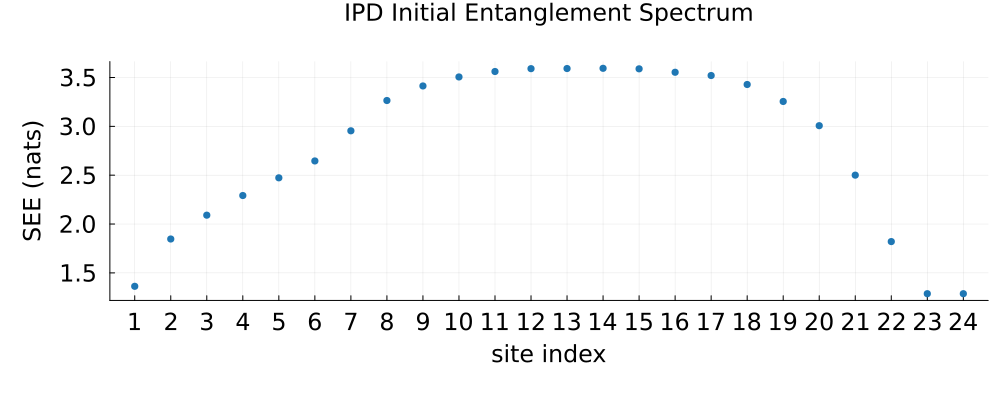

In [231]:
fstyle = font("sans-serif", 16)
scatter(ipd_before_measurement, ms=4, label="", msw=0, xticks=collect(1:1:24),
    xlabel="site index", ylabel="SEE (nats)", c=palette(:tab10)[1], title="IPD Initial Entanglement Spectrum",
    titlefont=fstyle, xtickfont=fstyle, ytickfont=fstyle, guidefont=fstyle,
    size=(1000, 400), left_margin=10mm, bottom_margin=15mm, top_margin=10mm)
#savefig("ipd_entanglement_spectrum_before_measurement.svg")

In [6]:
function measure_mps(mps::MPS, opts, xval::Float64, site::Int)
    # check xval in range
    if !(-1 ≤ xval ≤ 1)
        error("x value must be in encoding domain [-1, 1]")
    end
    # check site exists in mps
    if !(1 ≤ site ≤ length(mps))
        error("Site must exist in the MPS")
    end
    psi = deepcopy(mps)
    total_num_sites = length(psi)
    s = siteinds(psi)
    known_state_as_ITensor = itensor(get_state(xval, opts), s[site])
    site_loc = findsite(psi, s[site])
    A = psi[site_loc] # extract the site to measure from the MPS 
    Am = A * dag(known_state_as_ITensor)
    if site_loc == total_num_sites
        A_new = psi[(site_loc-1)] * Am # absorb into previous site
    else
        A_new = psi[(site_loc+1)] * Am
    end
    
    normalize!(A_new)
    psi[site_loc] = ITensor(1) # replace old site with Identity
    if site_loc == total_num_sites
        psi[site_loc-1] = A_new
    else
        psi[site_loc + 1] = A_new
    end
    # collapse the MPS to the remaining unmeasured sites
    mps_el = [tens for tens in psi if ndims(tens) > 0]
    mps_measured = MPS(mps_el)
    normalize!(mps_measured)
    return mps_measured
end

measure_mps (generic function with 1 method)

In [188]:
ts = rand(10)
measure_sites = [3, 4, 5]
sites = siteinds(mps)
encoded_ts = MPS([ITensor(ts[i], sites[i]) for i in measure_sites])

MPS
[1] ((dim=12|id=363|"Site,n=3"),)
[2] ((dim=12|id=965|"Site,n=4"),)
[3] ((dim=12|id=496|"Site,n=5"),)


In [198]:
function measure_mps_with_ts_sample(mps::MPS, ts::Vector{<:Real}, measure_sites::Vector)
    # measure the mps with values from an actual (normalised) time series
    # check that the time series is in the encoding domain
    if !all(-1 .≤ ts .≤ 1)
        error("Time series must be normalised to the interval [-1, 1].")
    end
    psi = deepcopy(mps)
    total_num_sites = length(psi)
    sites = siteinds(psi)
    encoded_ts = MPS([ITensor(ts[i], sites[i]) for i in 1:length(ts)]) # encode all values, only use measure_sites
    # loop through mps and measure sites of interest
    for i in 1:total_num_sites
        if i in measure_sites
            site_loc = findsite(psi, sites[i]) # get the site of interest
            A = psi[site_loc] # extract the site to measure from the MPS 
            known_state_as_ITensor = encoded_ts[i]
            Am = A * dag(known_state_as_ITensor)
            if site_loc == total_num_sites
                A_new = psi[(site_loc-1)] * Am # will IndexError if there are no sites to impute
            else
                A_new = psi[(site_loc+1)] * Am
            end
            normalize!(A_new)
            psi[site_loc] = ITensor(1)
            if site_loc == total_num_sites
                psi[site_loc - 1] = A_new 
            else
                psi[site_loc + 1] = A_new
            end
            println("Measured site $i")
        end
    end
    # collapse the MPS to the remaining unmeasured sites
    mps_el = [tens for tens in psi if ndims(tens) > 0]
    mps_measured = MPS(mps_el)
    normalize!(mps_measured)

    return mps_measured
end

measure_mps_with_ts_sample (generic function with 1 method)

In [234]:
X_train_scaled, norms = transform_train_data(X_train; opts=opts);
X_test_scaled, _ = transform_test_data(X_test, norms; opts=opts);

┌ Warning: Test set has a value more than 1% below lower bound after train normalization! lb=-0.07770515908031447
└ @ Main /Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/LogLoss/utils.jl:253
┌ Warning: Test set has a value more than 1% below lower bound after train normalization! lb=-0.09112157823813859
└ @ Main /Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/LogLoss/utils.jl:253


5 rescaling operations were performed!


┌ Warning: Test set has a value more than 1% above upper bound after train normalization! ub=1.1967932908732675
└ @ Main /Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/LogLoss/utils.jl:263
┌ Warning: Test set has a value more than 1% above upper bound after train normalization! ub=1.0561060075720665
└ @ Main /Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/LogLoss/utils.jl:263
┌ Warning: Test set has a value more than 1% above upper bound after train normalization! ub=1.0289034091057059
└ @ Main /Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/LogLoss/utils.jl:263


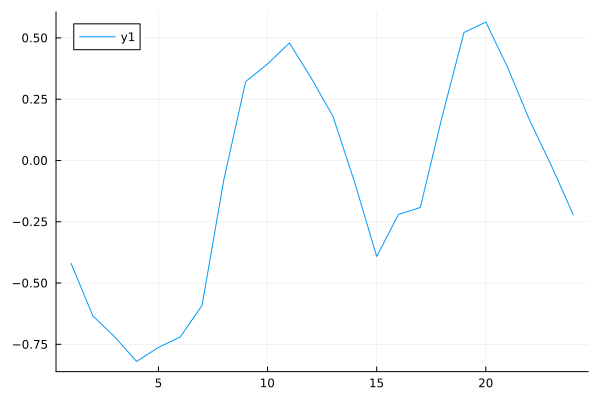

In [235]:
plot(X_train_scaled[1, :])

In [263]:
mps_before_see = entropy_von_neumann_see(mps);
mps_before = sum(mps_before_see) - mps_before_see[24]
mps_before_avg = mps_before/23
ms1 = measure_mps_with_ts_sample(mps, ts, [24])
ms1_see = entropy_von_neumann_see(out)
ms1_avg = sum(ms1_see)/23
other = (sum(ms1_see) - mps_before)/23

Measured site 24


-0.3029488550509792

In [180]:
m_s2_03 = measure_mps(mps, opts, 0.3, 2);
see_s2_03 = entropy_von_neumann_see(m_s2_03);
see_s2_03_compare = fill(NaN, 24)
see_s2_03_compare[1] = see_s2_03[1]
see_s2_03_compare[3:end] = see_s2_03[2:end];

In [181]:
m_s2_08 = measure_mps(mps, opts, 0.8, 2);
see_s2_08 = entropy_von_neumann_see(m_s2_08);
see_s2_08_compare = fill(NaN, 24)
see_s2_08_compare[1] = see_s2_08[1]
see_s2_08_compare[3:end] = see_s2_08[2:end];

In [185]:
m_s2_05 = measure_mps(mps, opts, 0.5, 2);
see_s2_05 = entropy_von_neumann_see(m_s2_05);
see_s2_05_compare = fill(NaN, 24)
see_s2_05_compare[1] = see_s2_05[1]
see_s2_05_compare[3:end] = see_s2_05[2:end];

In [238]:
m_s2_n05 = measure_mps(mps, opts, -0.5, 2);
see_s2_n05 = entropy_von_neumann_see(m_s2_05);
see_s2_n05_compare = fill(NaN, 24)
see_s2_n05_compare[1] = see_s2_n05[1]
see_s2_n05_compare[3:end] = see_s2_n05[2:end];

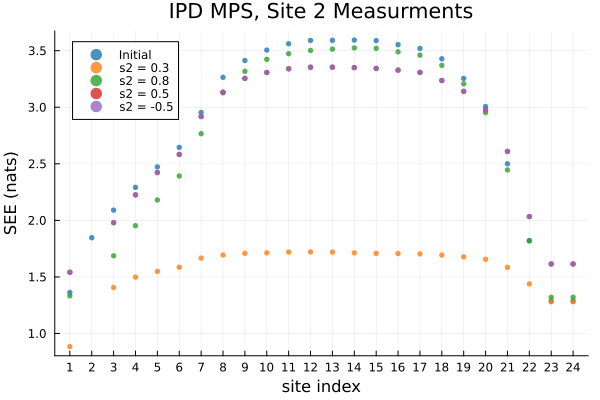

In [239]:
cpal = palette(:tab10)
scatter(ipd_before_measurement, label="Initial", c=cpal[1], ms=3, msw=0, legend=:topleft,
    xlabel="site index", ylabel="SEE (nats)", xticks=collect(1:1:24), alpha=0.8,
    title="IPD MPS, Site 2 Measurments")
scatter!(see_s2_03_compare, label="s2 = 0.3", c=cpal[2], ms=3, msw=0,alpha=0.8)
scatter!(see_s2_08_compare, label="s2 = 0.8", c=cpal[3], ms=3, msw=0,alpha=0.8)
scatter!(see_s2_05_compare, label="s2 = 0.5", c=cpal[4], ms=3, msw=0,alpha=0.8)
scatter!(see_s2_n05_compare, label="s2 = -0.5", c=cpal[5], ms=3, msw=0,alpha=0.8)

In [246]:
ee_before = sum(ipd_before_measurement) - ipd_before_measurement[2]
ee_after = sum(see_s2_03)
ee_sum_variation = ee_after - ee_before
ee_avg_variation = ee_sum_variation/23

-1.2727342728330344

In [255]:
xvals = -1:0.01:1
mean_variations = zeros(length(xvals));
ee_before = sum(ipd_before_measurement) - ipd_before_measurement[2] # remove contribution from measured site 
site_loc = 2
for (i, x) in enumerate(xvals)
    println("$i")
    measured_mps = measure_mps(mps, opts, x, site_loc);
    see_measured_allsites = entropy_von_neumann_see(measured_mps);
    ee_after = sum(see_measured_allsites)
    sum_ee_variation = ee_after - ee_before
    ee_avg_variation = sum_ee_variation/length(measured_mps)
    mean_variations[i] = ee_avg_variation
end


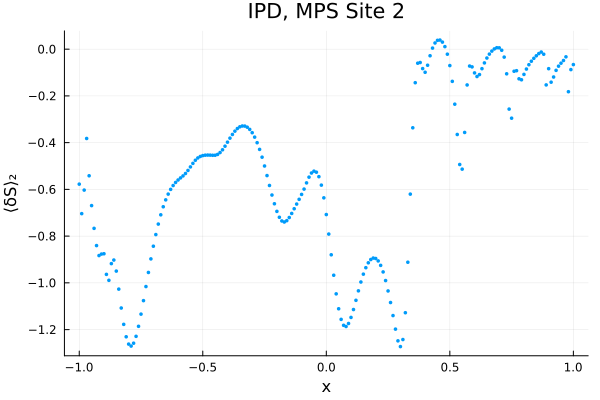

In [268]:
scatter(xvals, mean_variations, ms=2, msw=0, xlabel="x", ylabel="⟨δS⟩₂", label="",
    title="IPD, MPS Site 2")

Loop over all sites

In [33]:
xvals = -1:0.005:1
ee_before = sum(ipd_before_measurement) - ipd_before_measurement[2] # remove contribution from measured site 
mean_var_matrix = zeros(length(xvals), length(mps))
sites = 1:24
for s in sites
    println("Evaluating site $s")
    sitewise_per_x_variations = zeros(length(xvals))
    time_taken = @elapsed begin
        for i in 1:length(xvals)
            measured_mps = measure_mps(mps, opts, xvals[i], s);
            see_measured_allsites = entropy_von_neumann_see(measured_mps);
            ee_after = sum(see_measured_allsites)
            sum_ee_variation = ee_after - ee_before
            ee_avg_variation = sum_ee_variation/length(measured_mps)
            sitewise_per_x_variations[i] = ee_avg_variation
        end
    end
    mean_var_matrix[:, s] = sitewise_per_x_variations
    println("Time taken for site $s: $time_taken")
end

Evaluating site 1
Time taken for site 1: 75.20107225
Evaluating site 2
Time taken for site 2: 77.890603208
Evaluating site 3
Time taken for site 3: 83.596313667
Evaluating site 4
Time taken for site 4: 79.03105425
Evaluating site 5
Time taken for site 5: 77.221383791
Evaluating site 6
Time taken for site 6: 86.22087225
Evaluating site 7
Time taken for site 7: 76.018929792
Evaluating site 8
Time taken for site 8: 69.488849542
Evaluating site 9
Time taken for site 9: 75.432565333
Evaluating site 10
Time taken for site 10: 77.471134625
Evaluating site 11
Time taken for site 11: 81.0542215
Evaluating site 12
Time taken for site 12: 85.53132275
Evaluating site 13
Time taken for site 13: 89.980371916
Evaluating site 14
Time taken for site 14: 86.471350042
Evaluating site 15
Time taken for site 15: 67.767980791
Evaluating site 16
Time taken for site 16: 73.577490292
Evaluating site 17
Time taken for site 17: 82.460276625
Evaluating site 18
Time taken for site 18: 85.894794166
Evaluating site 

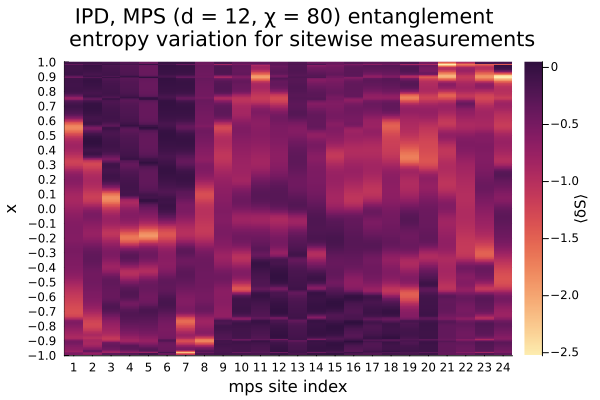

In [61]:
heatmap(collect(1:1:24), xvals, mean_var_matrix, xticks=collect(1:1:24), yticks=collect(-1:0.1:1),
    xlabel="mps site index", ylabel="x", colorbar_title="⟨δS⟩", title="IPD, MPS (d = $(opts.d), χ = $(opts.chi_max)) entanglement 
    entropy variation for sitewise measurements", top_margin=5mm, c=:matter)
#savefig("IPD_ee_variation_single_site.svg")

In [203]:
mean_avg_ee_variation = mean(mean_var_matrix, dims=1)[1, :]
std_avg_ee_variation = std(mean_var_matrix, dims=1)[1, :];
median_avg_ee_variation = median(mean_var_matrix, dims=1)[1, :]
range_avg_ee_variation = maximum(mean_var_matrix, dims=1)[1, :] - minimum(mean_var_matrix, dims=1)[1, :];
sum_avg_ee_variation = sum(mean_var_matrix, dims=1)[1, :]; # sitewise sum

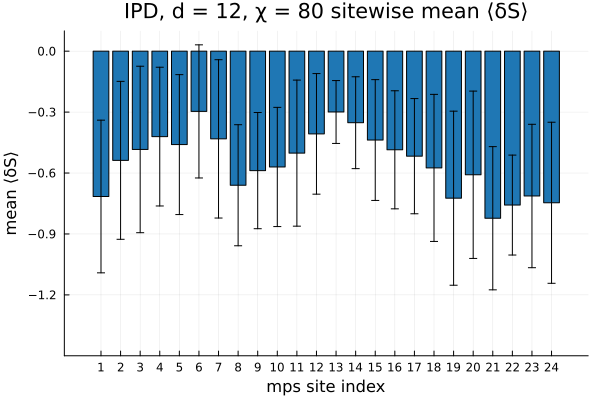

In [148]:
bar(mean_avg_ee_variation, yerr=std_avg_ee_variation, xlabel="mps site index", 
    c=palette(:tab10)[1], label="", ylabel="mean ⟨δS⟩", ylims=(-1.5, 0.1), 
    xticks=collect(1:1:24), title="IPD, d = 12, χ = 80 sitewise mean ⟨δS⟩")
#savefig("ipd_sitewise_mean_ee_variation.svg")

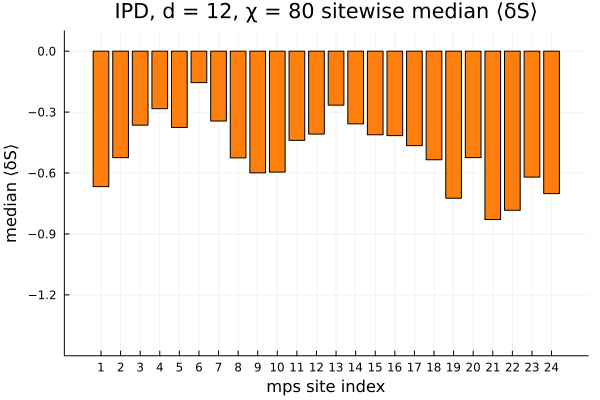

In [159]:
bar(median_avg_ee_variation, xlabel="mps site index", 
    c=palette(:tab10)[2], label="", ylabel="median ⟨δS⟩", ylims=(-1.5, 0.1), 
    xticks=collect(1:1:24), title="IPD, d = 12, χ = 80 sitewise median ⟨δS⟩")
#savefig("ipd_sitewise_median_ee_variation.svg")

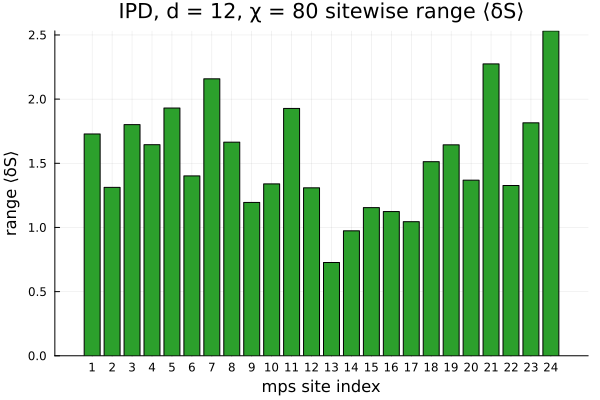

In [164]:
bar(range_avg_ee_variation, xlabel="mps site index", 
    c=palette(:tab10)[3], label="", ylabel="range ⟨δS⟩", 
    xticks=collect(1:1:24), title="IPD, d = 12, χ = 80 sitewise range ⟨δS⟩")
#savefig("ipd_sitewise_range_ee_variation.svg")

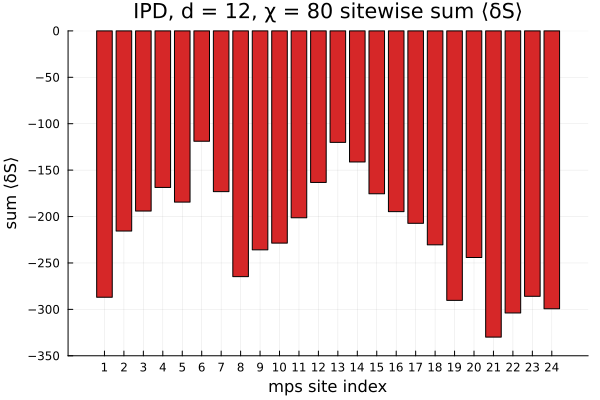

In [212]:
bar(sum_avg_ee_variation, xlabel="mps site index", 
    c=palette(:tab10)[4], label="", ylabel="sum ⟨δS⟩", ylims=(-350, 0),
    xticks=collect(1:1:24), title="IPD, d = 12, χ = 80 sitewise sum ⟨δS⟩")

In [62]:
JLD2.@load "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi30.jld2"

2-element Vector{Symbol}:
 :mps
 :opts

In [92]:
ipd_chi30_f = jldopen("/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi30.jld2");
mps_ipd_chi30 = read(ipd_chi30_f, "mps")
opts_ipd_chi30 = read(ipd_chi30_f, "opts");
ipd_chi50_f = jldopen("/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi50.jld2");
mps_ipd_chi50 = read(ipd_chi50_f, "mps")
opts_ipd_chi50 = read(ipd_chi50_f, "opts");
ipd_chi80_f = jldopen("/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi80.jld2");
mps_ipd_chi80 = read(ipd_chi80_f, "mps")
opts_ipd_chi80 = read(ipd_chi80_f, "opts");
ipd_chi10_f = jldopen("/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi10.jld2");
mps_ipd_chi10 = read(ipd_chi10_f, "mps")
opts_ipd_chi10 = read(ipd_chi10_f, "opts");

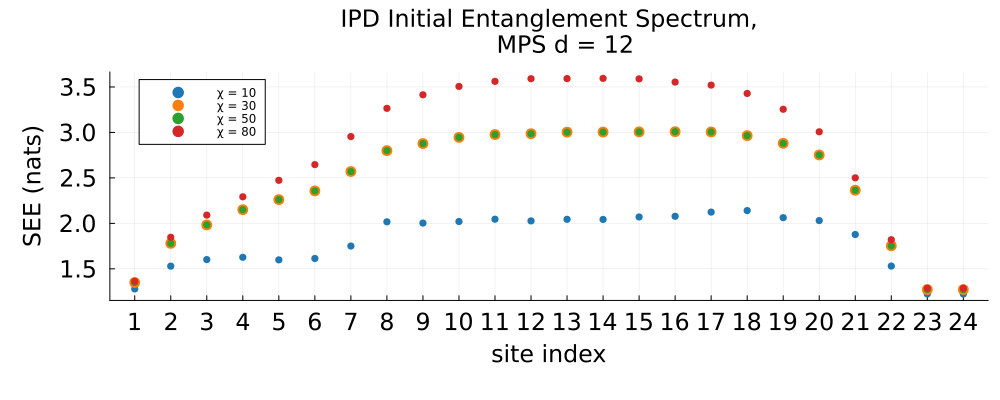

In [103]:
ipd_before_measurement_chi30 = entropy_von_neumann_see(mps_ipd_chi30);
ipd_before_measurement_chi50 = entropy_von_neumann_see(mps_ipd_chi50);
ipd_before_measurement_chi80 = entropy_von_neumann_see(mps_ipd_chi80);
ipd_before_measurement_chi10 = entropy_von_neumann_see(mps_ipd_chi10);
fstyle = font("sans-serif", 16)
scatter(ipd_before_measurement_chi10, ms=4, msw=0, xticks=collect(1:1:24),
    xlabel="site index", ylabel="SEE (nats)", c=palette(:tab10)[1], title="IPD Initial Entanglement Spectrum,
    MPS d = $(opts.d)",
    titlefont=fstyle, xtickfont=fstyle, ytickfont=fstyle, guidefont=fstyle,
    size=(1000, 400), left_margin=10mm, bottom_margin=15mm, top_margin=10mm, label="χ = 10")
scatter!(ipd_before_measurement_chi30, label="χ = 30", c=palette(:tab10)[2], ms=6, msw=0)
scatter!(ipd_before_measurement_chi50, label="χ = 50", c=palette(:tab10)[3], ms=4, msw=0)
scatter!(ipd_before_measurement_chi80, label="χ = 80", c=palette(:tab10)[4], ms=4, msw=0)
#savefig("ipd_entanglement_spectrum_before_measurement.svg")

In [269]:
xvals = -1:0.01:1
mean_variations = zeros(length(xvals));
ee_before = sum(ipd_before_measurement) - ipd_before_measurement[2] # remove contribution from measured site 
site_loc = 1
for (i, x) in enumerate(xvals)
    println("$i")
    measured_mps = measure_mps(mps, opts, x, site_loc);
    see_measured_allsites = entropy_von_neumann_see(measured_mps);
    ee_after = sum(see_measured_allsites)
    sum_ee_variation = ee_after - ee_before
    ee_avg_variation = sum_ee_variation/length(measured_mps)
    mean_variations[i] = ee_avg_variation
end


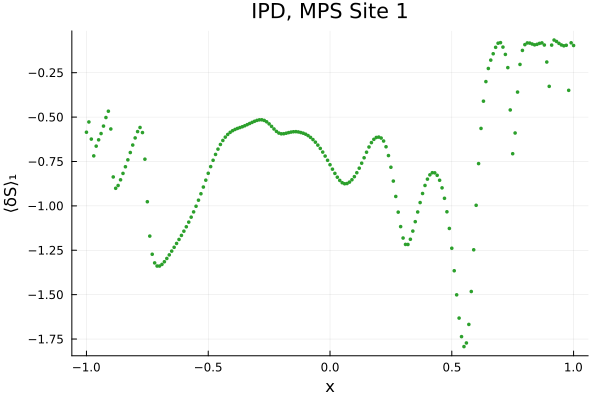

In [274]:
scatter(xvals, mean_variations, ms=2, msw=0, xlabel="x", ylabel="⟨δS⟩₁", label="",
    title="IPD, MPS Site 1", c=cpal[3])

In [ ]:
function ee_variation_mps(mps::MPS, opts::Options,
    timeseries::AbstractVector{<:Number}, measure_sites::Vector{Int})
    if isempty(measure_sites)
        throw(ArgumentError("measure_sites can't be empty!")) 
    end
    psi = deepcopy(mps)
    s = siteinds(psi)
    timeseries_enc = MPS([itensor(get_state(t, opts), s[i]) for (i, t) in enumerate(timeseries)])
    total_num_sites = length(psi)

    # get the initial SEE
    see_init = entropy_von_neumann_see(psi)
    # condition the MPS
    last_impute_idx = 0
    for i in 1:total_num_sites
        if i in measure_sites
            site_loc = findsite(psi, s[i])
            A = psi[site_loc] # extract the site to measure from the MPS 
            known_state_as_ITensor = timeseries_enc[i]
            Am = A * dag(known_state_as_ITensor)
            if site_loc == total_num_sites
                A_new = psi[last_impute_idx] * Am # will IndexError if there are no sites to impute
            else
                A_new = psi[(site_loc+1)] * Am
            end
            normalize!(A_new)
            psi[site_loc] = ITensor(1)
            if site_loc == total_num_sites
                psi[last_impute_idx] = A_new 
            else
                psi[site_loc + 1] = A_new
            end
        else
            last_impute_idx = i
        end
    end
    # collapse the MPS to the remaining unmeasured sites
    mps_el = [tens for tens in psi if ndims(tens) > 0]
    mps_measured = MPS(mps_el)

    # compute SEE after measurements
    see_final = entropy_von_neumann_see(mps_measured)
    return see_init, see_final
end

In [3]:
function entropy_von_neumann(rho::ITensor)
    # get the von Neumann entropy of any given density matrix rho
    SvN = 0.0
    D, _ = eigen(rho)
    for n in 1:ITensors.dim(D, 1)
        p = real(D[n, n]^2)
        if (p > 1E-12) 
            SvN -= p * log2(p) # to avoid log(0)
        end
    end
    return SvN
end

entropy_von_neumann (generic function with 1 method)

In [4]:
function two_site_rdm(mps::MPS, A::Int, B::Int)
    # compute the two site rdm for sites A and B
    mps_length = length(mps)
    if !(1 ≤ A ≤ mps_length) || !(1 ≤ B ≤ mps_length)
        error("A and B must be valid sites in the MPS!")
    end
    if A >= B
        B_site = A
        A_site = B
    else
        A_site = A
        B_site = B
    end
    psi = deepcopy(mps)
    sites = siteinds(psi)
    orthogonalize!(psi, A_site)
    psidag = prime(dag(psi), linkinds(psi))
    rho = prime(psi[A_site], linkinds(psi, A_site-1)) * prime(psidag[A_site], sites[A_site])
    for i in (A_site+1):(B_site-1)
        rho *= psi[i] * psidag[i]
    end
    rho *= prime(psi[B_site], linkinds(psi, B_site)) * prime(psidag[B_site], sites[B_site])
    return rho
end

two_site_rdm (generic function with 1 method)

In [5]:
function one_site_rdm(mps::MPS, A::Int)
    psi = deepcopy(mps)
    sites = siteinds(psi)
    orthogonalize!(psi, A)
    psidag = dag(psi)
    rho = prime(psi[A], sites[A]) * psidag[A]
    return rho
end

one_site_rdm (generic function with 1 method)

In [6]:
function qmi(mps::MPS, A::Int, B::Int)
    # compute the quantum mutual information between sites A and B
    rho_A = one_site_rdm(mps, A) # one site rdm for site A 
    SA = entropy_von_neumann(rho_A) # entropy for site A rdm
    rho_B = one_site_rdm(mps, B) # one site rdm for site B 
    SB =  entropy_von_neumann(rho_B) # entropy for site B rdm
    rho_AB = two_site_rdm(mps, A, B)
    SAB = entropy_von_neumann(rho_AB)
    mi = SA + SB - SAB
    return mi
end

qmi (generic function with 1 method)

In [7]:
function qce(mps::MPS, B::Int, A::Int)
    # compute the quantum conditional entropy for B | A (B given A)
    rho_AB = two_site_rdm(mps, A, B)
    rho_A = one_site_rdm(mps, A)
    SAB = entropy_von_neumann(rho_AB)
    SA = entropy_von_neumann(rho_A)
    return SAB - SA 
end

qce (generic function with 1 method)

In [8]:
function info_theoretic_quantities(mps::MPS, A::Int, B::Int)
    # compute both qmi and qce in one go
    rho_A = one_site_rdm(mps, A) # one site rdm for site A 
    SA = entropy_von_neumann(rho_A) # entropy for site A rdm
    rho_B = one_site_rdm(mps, B) # one site rdm for site B 
    SB =  entropy_von_neumann(rho_B) # entropy for site B rdm
    rho_AB = two_site_rdm(mps, A, B)
    SAB = entropy_von_neumann(rho_AB)
    # get the mutual information
    mi = SA + SB - SAB
    # get the conditional entropy H(B | A)
    ce_b_a = SAB - SA
    # get the conditional entropy H(A | B)
    ce_a_b = SAB - SB
    info = Dict(:MI => mi, :CE_B_A => ce_b_a, :CE_A_B => ce_a_b)
    return info
end

info_theoretic_quantities (generic function with 1 method)

In [26]:
qmis = zeros(length(mps), length(mps))
for i in 1:length(mps)
    for j in 1:length(mps)
        if i != j
            if j > i
                println("$i, $j")
                qmis[i, j] = qmi(mps, i, j)
            end
        end
    end
end

1, 2
1, 3
1, 4
1, 5
1, 6
1, 7
1, 8
1, 9
1, 10
1, 11
1, 12
1, 13
1, 14
1, 15
1, 16
1, 17
1, 18
1, 19
1, 20
1, 21
1, 22
1, 23
1, 24
2, 3
2, 4
2, 5
2, 6
2, 7
2, 8
2, 9
2, 10
2, 11
2, 12
2, 13
2, 14
2, 15
2, 16
2, 17
2, 18
2, 19
2, 20
2, 21
2, 22
2, 23
2, 24
3, 4
3, 5
3, 6
3, 7
3, 8
3, 9
3, 10
3, 11
3, 12
3, 13
3, 14
3, 15
3, 16
3, 17
3, 18
3, 19
3, 20
3, 21
3, 22
3, 23
3, 24
4, 5
4, 6
4, 7
4, 8
4, 9
4, 10
4, 11
4, 12
4, 13
4, 14
4, 15
4, 16
4, 17
4, 18
4, 19
4, 20
4, 21
4, 22
4, 23
4, 24
5, 6
5, 7
5, 8
5, 9
5, 10
5, 11
5, 12
5, 13
5, 14
5, 15
5, 16
5, 17
5, 18
5, 19
5, 20
5, 21
5, 22
5, 23
5, 24
6, 7
6, 8
6, 9
6, 10
6, 11
6, 12
6, 13
6, 14
6, 15
6, 16
6, 17
6, 18
6, 19
6, 20
6, 21
6, 22
6, 23
6, 24
7, 8
7, 9
7, 10
7, 11
7, 12
7, 13
7, 14
7, 15
7, 16
7, 17
7, 18
7, 19
7, 20
7, 21
7, 22
7, 23
7, 24
8, 9
8, 10
8, 11
8, 12
8, 13
8, 14
8, 15
8, 16
8, 17
8, 18
8, 19
8, 20
8, 21
8, 22
8, 23
8, 24
9, 10
9, 11
9, 12
9, 13
9, 14
9, 15
9, 16
9, 17
9, 18
9, 19
9, 20
9, 21
9, 22
9, 23
9, 24
10, 11
10,

In [27]:
qces_forward = zeros(length(mps), length(mps))
for i in 1:length(mps)
    for j in i+1:length(mps)
            println("H($j | $i) -> ([$i, $j])")
            qces_forward[i, j] = qce(mps, j, i)  # H(j | i)
    end
end

H(2 | 1) -> ([1, 2])
H(3 | 1) -> ([1, 3])
H(4 | 1) -> ([1, 4])
H(5 | 1) -> ([1, 5])
H(6 | 1) -> ([1, 6])
H(7 | 1) -> ([1, 7])
H(8 | 1) -> ([1, 8])
H(9 | 1) -> ([1, 9])
H(10 | 1) -> ([1, 10])
H(11 | 1) -> ([1, 11])
H(12 | 1) -> ([1, 12])
H(13 | 1) -> ([1, 13])
H(14 | 1) -> ([1, 14])
H(15 | 1) -> ([1, 15])
H(16 | 1) -> ([1, 16])
H(17 | 1) -> ([1, 17])
H(18 | 1) -> ([1, 18])
H(19 | 1) -> ([1, 19])
H(20 | 1) -> ([1, 20])
H(21 | 1) -> ([1, 21])
H(22 | 1) -> ([1, 22])
H(23 | 1) -> ([1, 23])
H(24 | 1) -> ([1, 24])
H(3 | 2) -> ([2, 3])
H(4 | 2) -> ([2, 4])
H(5 | 2) -> ([2, 5])
H(6 | 2) -> ([2, 6])
H(7 | 2) -> ([2, 7])
H(8 | 2) -> ([2, 8])
H(9 | 2) -> ([2, 9])
H(10 | 2) -> ([2, 10])
H(11 | 2) -> ([2, 11])
H(12 | 2) -> ([2, 12])
H(13 | 2) -> ([2, 13])
H(14 | 2) -> ([2, 14])
H(15 | 2) -> ([2, 15])
H(16 | 2) -> ([2, 16])
H(17 | 2) -> ([2, 17])
H(18 | 2) -> ([2, 18])
H(19 | 2) -> ([2, 19])
H(20 | 2) -> ([2, 20])
H(21 | 2) -> ([2, 21])
H(22 | 2) -> ([2, 22])
H(23 | 2) -> ([2, 23])
H(24 | 2) -> ([2, 

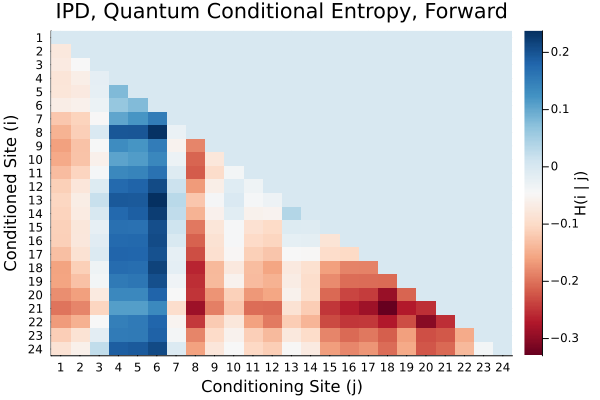

In [28]:
heatmap(
    collect(1:24), collect(1:24), qces_forward',
    c = :RdBu,
    xticks = (1:24),
    yticks = (1:24),
    xlabel = "Conditioning Site (j)",
    ylabel = "Conditioned Site (i)",
    title = "IPD, Quantum Conditional Entropy, Forward",
    colorbar_title = "H(i | j)"
)
yflip!(true)

In [30]:
qces_rev = zeros(length(mps), length(mps))
for i in 1:length(mps)
    for j in i+1:length(mps)
            println("H($i | $j) -> ([$i, $j])")
            qces_rev[i, j] = qce(mps, i, j)  # H(j | i)
    end
end

H(1 | 2) -> ([1, 2])
H(1 | 3) -> ([1, 3])
H(1 | 4) -> ([1, 4])
H(1 | 5) -> ([1, 5])
H(1 | 6) -> ([1, 6])
H(1 | 7) -> ([1, 7])
H(1 | 8) -> ([1, 8])
H(1 | 9) -> ([1, 9])
H(1 | 10) -> ([1, 10])
H(1 | 11) -> ([1, 11])
H(1 | 12) -> ([1, 12])
H(1 | 13) -> ([1, 13])
H(1 | 14) -> ([1, 14])
H(1 | 15) -> ([1, 15])
H(1 | 16) -> ([1, 16])
H(1 | 17) -> ([1, 17])
H(1 | 18) -> ([1, 18])
H(1 | 19) -> ([1, 19])
H(1 | 20) -> ([1, 20])
H(1 | 21) -> ([1, 21])
H(1 | 22) -> ([1, 22])
H(1 | 23) -> ([1, 23])
H(1 | 24) -> ([1, 24])
H(2 | 3) -> ([2, 3])
H(2 | 4) -> ([2, 4])
H(2 | 5) -> ([2, 5])
H(2 | 6) -> ([2, 6])
H(2 | 7) -> ([2, 7])
H(2 | 8) -> ([2, 8])
H(2 | 9) -> ([2, 9])
H(2 | 10) -> ([2, 10])
H(2 | 11) -> ([2, 11])
H(2 | 12) -> ([2, 12])
H(2 | 13) -> ([2, 13])
H(2 | 14) -> ([2, 14])
H(2 | 15) -> ([2, 15])
H(2 | 16) -> ([2, 16])
H(2 | 17) -> ([2, 17])
H(2 | 18) -> ([2, 18])
H(2 | 19) -> ([2, 19])
H(2 | 20) -> ([2, 20])
H(2 | 21) -> ([2, 21])
H(2 | 22) -> ([2, 22])
H(2 | 23) -> ([2, 23])
H(2 | 24) -> ([2, 

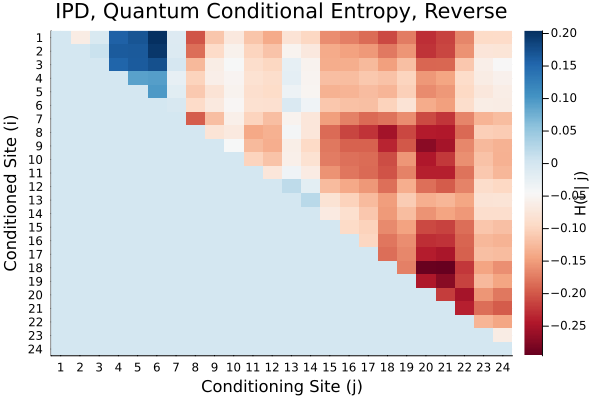

In [31]:
heatmap(
    collect(1:24), collect(1:24), qces_rev,
    c = :RdBu,
    xticks = (1:24),
    yticks = (1:24),
    xlabel = "Conditioning Site (j)",
    ylabel = "Conditioned Site (i)",
    title = "IPD, Quantum Conditional Entropy, Reverse",
    colorbar_title = "H(i | j)"
)
yflip!(true)

In [32]:
qmis_all = qmis + qmis'

24×24 Matrix{Float64}:
 0.0       0.935754  0.876061  0.712263  …  1.03894   0.965381  0.964212
 0.935754  0.0       0.849279  0.694519     1.01848   0.936092  0.937528
 0.876061  0.849279  0.0       0.648391     0.917416  0.864728  0.850731
 0.712263  0.694519  0.648391  0.0          0.72186   0.695255  0.687085
 0.700673  0.69339   0.639611  0.539159     0.716217  0.693328  0.683
 0.666482  0.660888  0.628859  0.536773  …  0.690673  0.664456  0.665492
 0.881492  0.868513  0.805173  0.653924     0.926185  0.889228  0.881462
 1.07446   1.04437   0.930992  0.731989     1.11815   1.03545   1.03813
 0.986011  0.952448  0.867979  0.690692     0.990793  0.949889  0.956698
 0.942518  0.916256  0.848135  0.681863     0.949983  0.906786  0.922533
 ⋮                                       ⋱                      
 1.04332   1.00656   0.941285  0.753004  …  1.12077   1.05724   1.06101
 1.0573    1.01301   0.930241  0.743065     1.11949   1.0461    1.04923
 1.08205   1.03607   0.953156  0.747989   

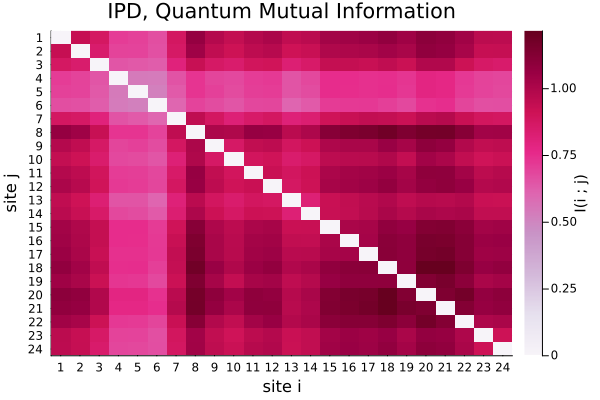

In [38]:
heatmap(collect(1:24), collect(1:24), qmis_all, c=:PuRd, 
    xticks=(1:24), yticks=(1:24), xlabel="site i",
    ylabel="site j", title="IPD, Quantum Mutual Information", colorbar_title="I(i ; j)")
yflip!(true)

In [40]:
see_mps = entropy_von_neumann_see(mps);

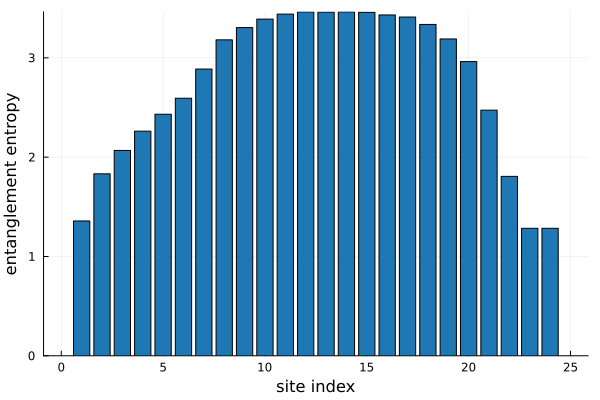

In [45]:
bar(collect(1:24), see_mps, label="", ylabel="entanglement entropy", xlabel="site index", c=palette(:tab10)[1])

In [9]:
JLD2.@load "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ecg_d_12_chi_80.jld2"

2-element Vector{Symbol}:
 :mps
 :opts_safe

In [54]:
qmis = zeros(length(mps), length(mps))
for i in 1:length(mps)
    for j in 1:length(mps)
        if i != j
            if j > i
                println("$i, $j")
                qmis[i, j] = qmi(mps, i, j)
            end
        end
    end
end

1, 2
1, 3
1, 4
1, 5
1, 6
1, 7
1, 8
1, 9
1, 10
1, 11
1, 12
1, 13
1, 14
1, 15
1, 16
1, 17
1, 18
1, 19
1, 20
1, 21
1, 22
1, 23
1, 24
1, 25
1, 26
1, 27
1, 28
1, 29
1, 30
1, 31
1, 32
1, 33
1, 34
1, 35
1, 36
1, 37
1, 38
1, 39
1, 40
1, 41
1, 42
1, 43
1, 44
1, 45
1, 46
1, 47
1, 48
1, 49
1, 50
1, 51
1, 52
1, 53
1, 54
1, 55
1, 56
1, 57
1, 58
1, 59
1, 60
1, 61
1, 62
1, 63
1, 64
1, 65
1, 66
1, 67
1, 68
1, 69
1, 70
1, 71
1, 72
1, 73
1, 74
1, 75
1, 76
1, 77
1, 78
1, 79
1, 80
1, 81
1, 82
1, 83
1, 84
1, 85
1, 86
1, 87
1, 88
1, 89
1, 90
1, 91
1, 92
1, 93
1, 94
1, 95
1, 96
2, 3
2, 4
2, 5
2, 6
2, 7
2, 8
2, 9
2, 10
2, 11
2, 12
2, 13
2, 14
2, 15
2, 16
2, 17
2, 18
2, 19
2, 20
2, 21
2, 22
2, 23
2, 24
2, 25
2, 26
2, 27
2, 28
2, 29
2, 30
2, 31
2, 32
2, 33
2, 34
2, 35
2, 36
2, 37
2, 38
2, 39
2, 40
2, 41
2, 42
2, 43
2, 44
2, 45
2, 46
2, 47
2, 48
2, 49
2, 50
2, 51
2, 52
2, 53
2, 54
2, 55
2, 56
2, 57
2, 58
2, 59
2, 60
2, 61
2, 62
2, 63
2, 64
2, 65
2, 66
2, 67
2, 68
2, 69
2, 70
2, 71
2, 72
2, 73
2, 74
2, 75
2, 76
2

In [58]:
qmis_all = qmis + qmis';

In [ ]:
# @save "ecg200_d12_chi80_qmis.jld2" qmis

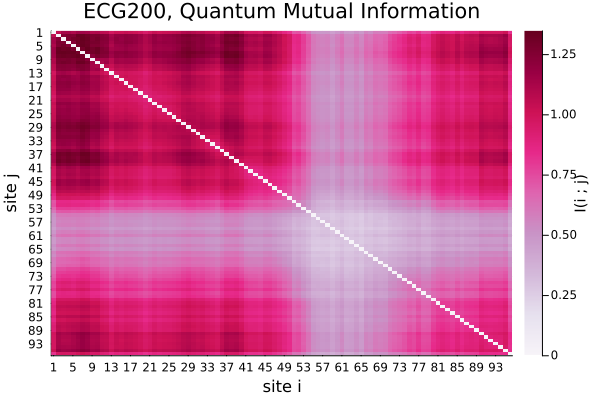

In [65]:
heatmap(collect(1:96), collect(1:96), qmis_all, c=:PuRd, 
    xticks=(1:4:96), yticks=(1:4:96), xlabel="site i",
    ylabel="site j", title="ECG200, Quantum Mutual Information", colorbar_title="I(i ; j)")
yflip!(true)
#savefig("ecg200_qmi_heatmap.svg")

In [ ]:
qmis = zeros(length(mps), length(mps))
qces_forward = zeros(length(mps), length(mps))
qces_reverse = zeros(length(mps), length(mps))
for i in 1:length(mps)
    for j in 1:length(mps)
        if i != j
            if j > i
                println("$i, $j")
                info = info_theoretic_quantities(mps, i, j)
                qmis[i, j] = info[:MI]
                qces_forward[i, j] = info[:CE_B_A] # j | i 
                qces_reverse[i, j] = info[:CE_A_B] # i | j
            end
        end
    end
end

1, 2
1, 3
1, 4
1, 5
1, 6
1, 7
1, 8
1, 9
1, 10
1, 11
1, 12
1, 13
1, 14
1, 15
1, 16
1, 17
1, 18
1, 19
1, 20
1, 21
1, 22
1, 23
1, 24
1, 25
1, 26
1, 27
1, 28
1, 29
1, 30
1, 31
1, 32
1, 33
1, 34
1, 35
1, 36
1, 37
1, 38
1, 39
1, 40
1, 41
1, 42
1, 43
1, 44
1, 45
1, 46
1, 47
1, 48
1, 49
1, 50
1, 51
1, 52
1, 53
1, 54
1, 55
1, 56
1, 57
1, 58
1, 59
1, 60
1, 61
1, 62
1, 63
1, 64
1, 65
1, 66
1, 67
1, 68
1, 69
1, 70
1, 71
1, 72
1, 73
1, 74
1, 75
1, 76
1, 77
1, 78
1, 79
1, 80
1, 81
1, 82
1, 83
1, 84
1, 85
1, 86
1, 87
1, 88
1, 89
1, 90
1, 91
1, 92
1, 93
1, 94
1, 95
1, 96
2, 3
2, 4
2, 5
2, 6
2, 7
2, 8
2, 9
2, 10
2, 11
2, 12
2, 13
2, 14
2, 15
2, 16
2, 17
2, 18
2, 19
2, 20
2, 21
2, 22
2, 23
2, 24
2, 25
2, 26
2, 27
2, 28
2, 29
2, 30
2, 31
2, 32
2, 33
2, 34
2, 35
2, 36
2, 37
2, 38
2, 39
2, 40
2, 41
2, 42
2, 43
2, 44
2, 45
2, 46
2, 47
2, 48
2, 49
2, 50
2, 51
2, 52
2, 53
2, 54
2, 55
2, 56
2, 57
2, 58
2, 59
2, 60
2, 61
2, 62
2, 63
2, 64
2, 65
2, 66
2, 67
2, 68
2, 69
2, 70
2, 71
2, 72
2, 73
2, 74
2, 75
2, 76
2

In [167]:
#@save "ecg200_d12_chi80_qmis_qces.jld2" qmis qces_forward qces_reverse

In [168]:
qmis_all = qmis + qmis'

96×96 Matrix{Float64}:
 0.0       1.05333   1.1379    1.13987   …  0.979132  1.01699   0.822237
 1.05333   0.0       1.24069   1.27353      1.13516   1.18142   0.965808
 1.1379    1.24069   0.0       1.25865      1.12239   1.15518   0.972387
 1.13987   1.27353   1.25865   0.0          1.11948   1.16225   0.964724
 1.10999   1.26149   1.29924   1.24027      1.13168   1.17561   0.962403
 1.15462   1.33734   1.31576   1.32781   …  1.15263   1.19695   0.994566
 1.15592   1.34486   1.34772   1.34037      1.18056   1.2293    1.01005
 1.14624   1.32155   1.33194   1.32033      1.16044   1.20875   0.989993
 1.09603   1.27818   1.27266   1.28532      1.11725   1.15172   0.95014
 1.1067    1.28333   1.2995    1.28608      1.12325   1.1636    0.960572
 ⋮                                       ⋱                      ⋮
 0.921508  1.0725    1.05516   1.07175      0.900954  0.928828  0.774585
 0.913215  1.06334   1.04493   1.06035      0.897056  0.92122   0.783722
 0.98859   1.14417   1.12155   1.1308

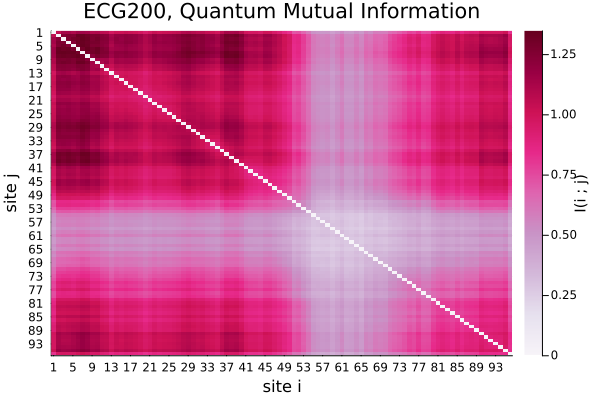

In [169]:
heatmap(collect(1:96), collect(1:96), qmis_all, c=:PuRd, 
    xticks=(1:4:96), yticks=(1:4:96), xlabel="site i",
    ylabel="site j", title="ECG200, Quantum Mutual Information", colorbar_title="I(i ; j)")
yflip!(true)

In [ ]:
heatmap(qces_forward',
    c = :RdBu,
    xticks = (1:4:96),
    yticks = (1:4:96),
    xlabel = "Conditioning Site (j)",
    ylabel = "Conditioned Site (i)",
    title = "ECG200, Quantum Conditional Entropy, Forward",
    colorbar_title = "H(i | j)"
)
yflip!(true)
#savefig("ecg200_qce_forward.svg")

"/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/FinalBenchmarks/entanglement_entropy/ecg200_qce_forward.svg"

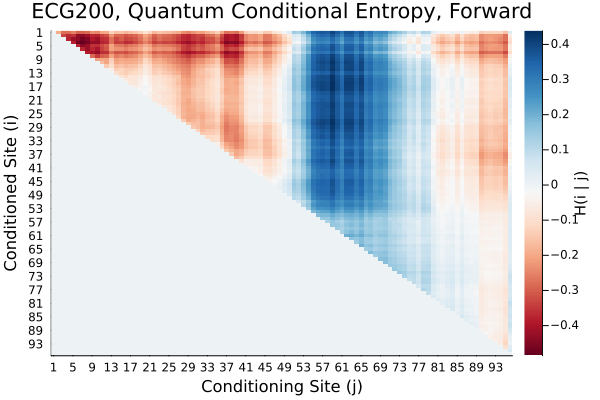

In [180]:
heatmap(qces_reverse,
    c = :RdBu,
    xticks = (1:4:96),
    yticks = (1:4:96),
    xlabel = "Conditioning Site (j)",
    ylabel = "Conditioned Site (i)",
    title = "ECG200, Quantum Conditional Entropy, Forward",
    colorbar_title = "H(i | j)"
)
yflip!(true)
#savefig("ecg200_qce_reverse.svg")

In [10]:
function ee_variation_mps(mps::MPS, opts::Options,
    timeseries::AbstractVector{<:Number}, measure_sites::Vector{Int})
    if isempty(measure_sites)
        throw(ArgumentError("measure_sites can't be empty!")) 
    end
    psi = deepcopy(mps)
    s = siteinds(psi)
    timeseries_enc = MPS([itensor(get_state(t, opts), s[i]) for (i, t) in enumerate(timeseries)])
    total_num_sites = length(psi)

    # get the initial SEE
    see_init = entropy_von_neumann_see(psi)
    # condition the MPS
    last_impute_idx = 0
    for i in 1:total_num_sites
        if i in measure_sites
            site_loc = findsite(psi, s[i])
            A = psi[site_loc] # extract the site to measure from the MPS 
            known_state_as_ITensor = timeseries_enc[i]
            Am = A * dag(known_state_as_ITensor)
            if site_loc == total_num_sites
                A_new = psi[last_impute_idx] * Am # will IndexError if there are no sites to impute
            else
                A_new = psi[(site_loc+1)] * Am
            end
            normalize!(A_new)
            psi[site_loc] = ITensor(1)
            if site_loc == total_num_sites
                psi[last_impute_idx] = A_new 
            else
                psi[site_loc + 1] = A_new
            end
        else
            last_impute_idx = i
        end
    end
    # collapse the MPS to the remaining unmeasured sites
    mps_el = [tens for tens in psi if ndims(tens) > 0]
    mps_measured = MPS(mps_el)

    # compute SEE after measurements
    see_final = entropy_von_neumann_see(mps_measured)
    return see_init, see_final
end

ee_variation_mps (generic function with 1 method)

In [319]:
dx = 0.01
xprobes = collect(-1:dx:1);
diffs = zeros(Float64, length(xprobes))
measure_sites = [1]
for (i, x) in enumerate(xprobes)
    println(i)
    test_ts = zeros(96);
    test_ts[1] = x
    before, after = ee_variation_mps(mps, opts_safe, test_ts, measure_sites);
    diff = sum(before) - sum(after)
    diffs[i] = diff
end

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201


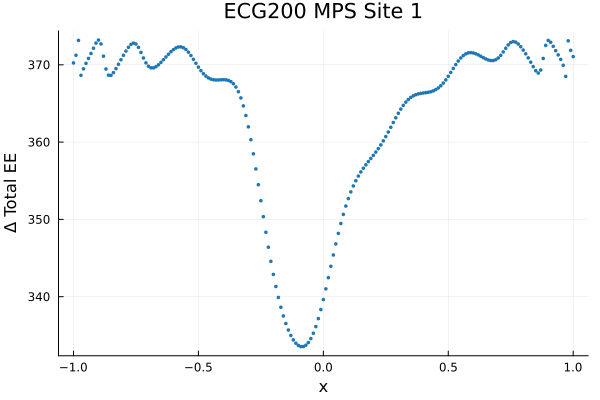

In [345]:
scatter(xprobes, diffs, ms=2, xlabel="x", ylabel="Δ Total EE", label="", title="ECG200 MPS Site 1", msw=0,
    c=palette(:tab10)[1])
#savefig("site_1_mps_ee_diffs.svg")

In [11]:
dx = 0.01
xprobes = collect(-1:dx:1);
diffs_s20 = zeros(Float64, length(xprobes))
measure_sites = [20]
@showprogress for i in eachindex(xprobes)
    test_ts = zeros(96);
    test_ts[20] = xprobes[i]
    before, after = ee_variation_mps(mps, opts_safe, test_ts, measure_sites);
    diff = sum(before) - sum(after)
    diffs_s20[i] = diff
end

Progress: 100%|█████████████████████████████████████████| Time: 0:08:40


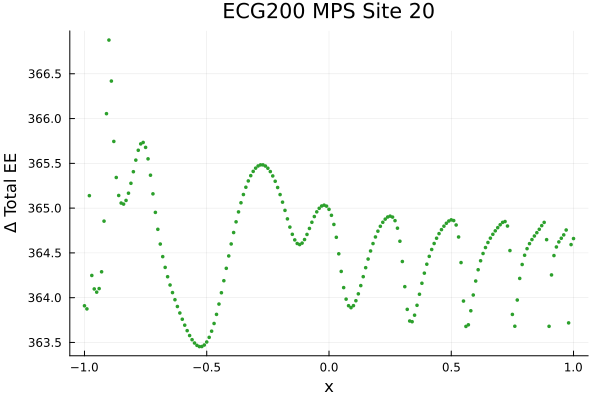

In [15]:
scatter(xprobes, diffs_s20, ms=2, xlabel="x", ylabel="Δ Total EE", label="", title="ECG200 MPS Site 20", msw=0,
    c=palette(:tab10)[3])
#savefig("site_20_mps_ee_diffs.svg")

Heatmap

In [42]:
dx = 0.02
xprobes = collect(-1:dx:1);
sites = collect(1:96)
diffs = zeros(Float64, length(xprobes), length(sites))
for site in 1:2
    measure_sites = [site]
    diff_per_site = Vector{Float64}(undef, length(xprobes))
    @showprogress for (ixpr, xpr) in enumerate(xprobes)
        test_ts = zeros(96);
        test_ts[site] = xpr
        before, after = ee_variation_mps(mps, opts_safe, test_ts, measure_sites);
        diff = sum(before) - sum(after)
        diff_per_site[ixpr] = diff
    end
    diffs[:, site] = diff_per_site
end

Progress: 100%|█████████████████████████████████████████| Time: 0:04:10
Progress: 100%|█████████████████████████████████████████| Time: 0:04:20


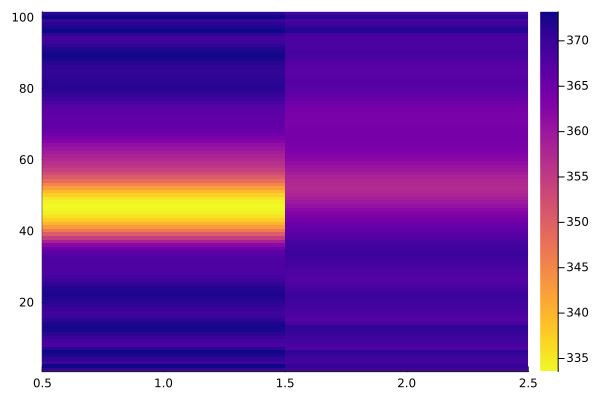

In [53]:
heatmap(diffs[1:end, 1:2], c=cgrad(:plasma, rev=true))

In [119]:
dloc =  "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/Data/ecg200/datasets/ecg200.jld2"
f = jldopen(dloc, "r")
    X_train = read(f, "X_train")
    y_train = zeros(Int64, size(X_train, 1))
    X_test = read(f, "X_test")
    y_test = zeros(Int64, size(X_test, 1))
close(f)

In [120]:
covmat_ecg = cov(X_train);

In [121]:
clim_max = maximum(abs.(covmat_ecg))

1.2072596098333408

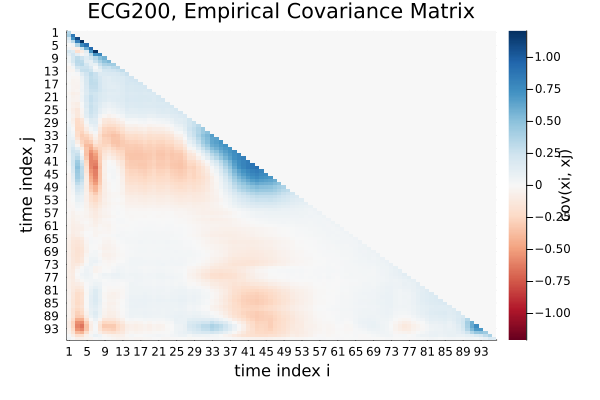

In [124]:
heatmap(tril(covmat_ecg), xticks = (1:4:96),
    yticks = (1:4:96), 
    xlabel="time index i",
    ylabel="time index j",
    c=:RdBu,
    clims=(-clim_max, clim_max),
    title="ECG200, Empirical Covariance Matrix",
    right_margin=5mm, left_margin=5mm, bottom_margin=5mm,
    colorbar_title="cov(xi, xj)")
yflip!(true)
#savefig("ecg200_empirical_covmat_tril.svg")

In [103]:
dloc =  "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/Data/italypower/datasets/ItalyPowerDemandOrig.jld2"
f = jldopen(dloc, "r")
    X_train = read(f, "X_train")
    y_train = zeros(Int64, size(X_train, 1))
    X_test = read(f, "X_test")
    y_test = zeros(Int64, size(X_test, 1))
close(f)

In [106]:
covmat_ipd = cov(X_train);
clim_max = maximum(abs.(covmat_ipd))

0.5031163562059947

In [113]:
using LinearAlgebra

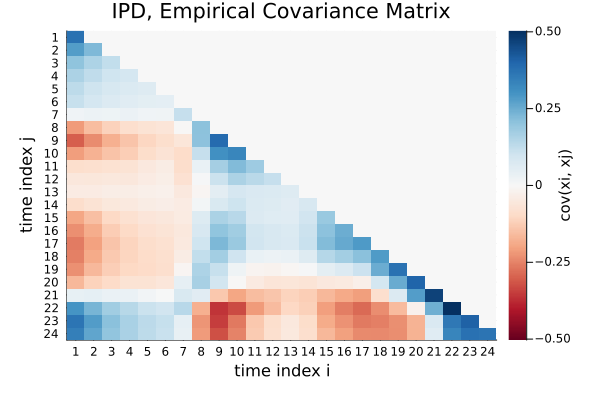

In [118]:
heatmap(tril(covmat_ipd), xticks = (1:1:24),
    yticks = (1:1:24), 
    xlabel="time index i",
    ylabel="time index j",
    c=:RdBu,
    clims=(-clim_max, clim_max),
    title="IPD, Empirical Covariance Matrix",
    right_margin=5mm, left_margin=5mm, bottom_margin=5mm,
    colorbar_title="cov(xi, xj)")
yflip!(true)
#savefig("ipd_empirical_covmat_tril.svg")

In [128]:
JLD2.@load "/Users/joshua/Desktop/QuantumInspiredMLFinal/QuantumInspiredML/ipd_d12_chi50.jld2"

1-element Vector{Symbol}:
 :mps

In [168]:
dx = 0.02
xprobes = collect(-1:dx:1);
sites = collect(1:24)
diffs = zeros(Float64, length(xprobes), length(sites))
for site in sites
    measure_sites = [site]
    diff_per_site = Vector{Float64}(undef, length(xprobes))
    test_ts = zeros(24);
    @showprogress desc="Computing site $site..." for (ixpr, xpr) in enumerate(xprobes)
        test_ts[site] = xpr
        before, after = ee_variation_mps(mps, opts_safe, test_ts, measure_sites);
        diff = sum(before) - sum(after)
        diff_per_site[ixpr] = diff
    end
    diffs[:, site] = diff_per_site
end

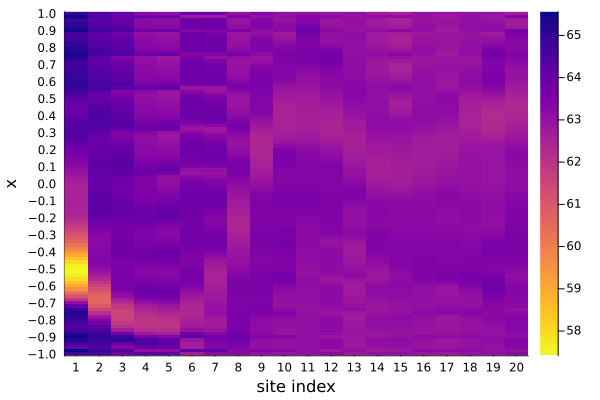

In [172]:
heatmap(collect(1:20), xprobes, diffs[:, 1:20], xticks=collect(1:1:20), 
    yticks=collect(-1:0.1:1.0), c=cgrad(:plasma, rev=true), ylabel="x", xlabel="site index")

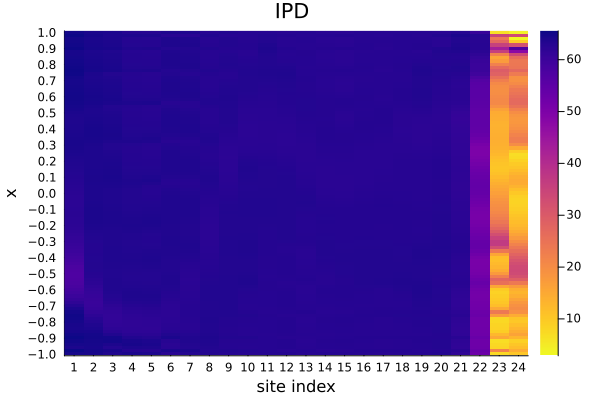

In [180]:
heatmap(collect(1:24), xprobes, diffs, xticks=collect(1:1:24), 
    yticks=collect(-1:0.1:1.0), c=cgrad(:plasma, rev=true), ylabel="x", xlabel="site index", 
    title="IPD ")

In [ ]:
enc = legendre_no_norm();

In [232]:
ds = 4:4:16
collect(ds)

4-element Vector{Int64}:
  4
  8
 12
 16

In [273]:
xvals = collect(-1:0.0001:1);
ds = 4:4:16
gt = 0.3
probas = zeros(Float64, length(ds), length(xvals))
for (id, d) in enumerate(ds)
    phi = enc.encode(gt, d)
    rdm = phi * phi'
    d_proba = zeros(Float64, length(xvals))
    for (ix, x) in enumerate(xvals)
        x_enc = enc.encode(x, d)
        proba = abs(x_enc' * rdm * x_enc)
        d_proba[ix] = proba
    end
    probas[id, :] = d_proba
end

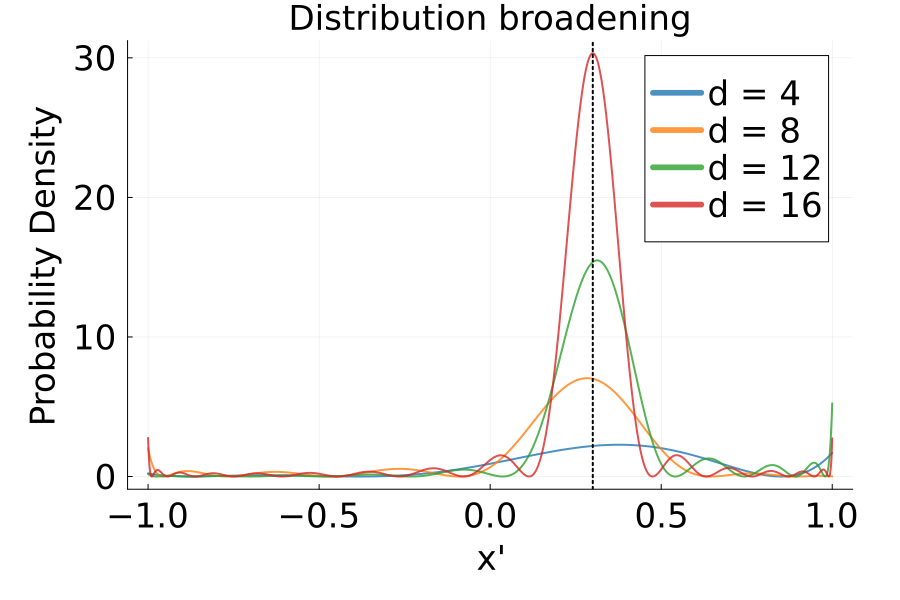

In [305]:
cpal = palette(:tab10)
fstyle = font("sans-serif", 23)
plot(xvals, probas[1, :], label="d = 4", c=cpal[1], lw=2, xlabel="x'", alpha=0.8,
    ylabel="Probability Density", xtickfont=fstyle, guidefont=fstyle, legendfont=fstyle,
    ytickfont=fstyle, size=(900, 600), left_margin=10mm, bottom_margin=10mm, right_margin=10mm, 
    title="Distribution broadening", titlefont=fstyle)
plot!(xvals, probas[2, :], c=cpal[2], label="d = 8", alpha=0.8,lw=2)
plot!(xvals, probas[3, :], c=cpal[3], label="d = 12", alpha=0.8,lw=2)
plot!(xvals, probas[4, :], c=cpal[4], label="d = 16", alpha=0.8,lw=2)
vline!([gt], lw=2, c=:black, ls=:dot, label="")
#savefig("dist_broadening.svg")

In [359]:
stats_per_d = Dict()
for d in ds
    phi = enc.encode(gt, d)
    rdm = phi * phi'
    opts=MPSOptions(; nsweeps=3, chi_max=10,  update_iters=1, verbosity=0, loss_grad=:KLD,
        bbopt=:TSGO, track_cost=true, eta=1.0, rescale = (false, true), d=d, aux_basis_dim=2, encoding=:legendre_no_norm, 
        encode_classes_separately=false, train_classes_separately=false, 
        exit_early=false, sigmoid_transform=false, init_rng=4567, chi_init=4)
    opts_safe, _... = safe_options(opts, nothing, nothing)
    mode_est = get_cpdf_mode(rdm, opts_safe, [])[1]
    mean_est = get_cpdf_mean_std(rdm, opts_safe, [])[1]
    median_est = get_median_from_rdm(rdm, opts_safe, [])[1]
    stats_per_d[d] = Dict(:mode => mode_est, :median => median_est, :mean => mean_est)
end

In [360]:
stats_per_d

Dict{Any, Any} with 4 entries:
  4  => Dict(:mode=>0.3769, :mean=>0.337747, :median=>0.349514)
  16 => Dict(:mode=>0.3, :mean=>0.281091, :median=>0.296932)
  12 => Dict(:mode=>0.3129, :mean=>0.32393, :median=>0.313061)
  8  => Dict(:mode=>0.2832, :mean=>0.218955, :median=>0.267712)

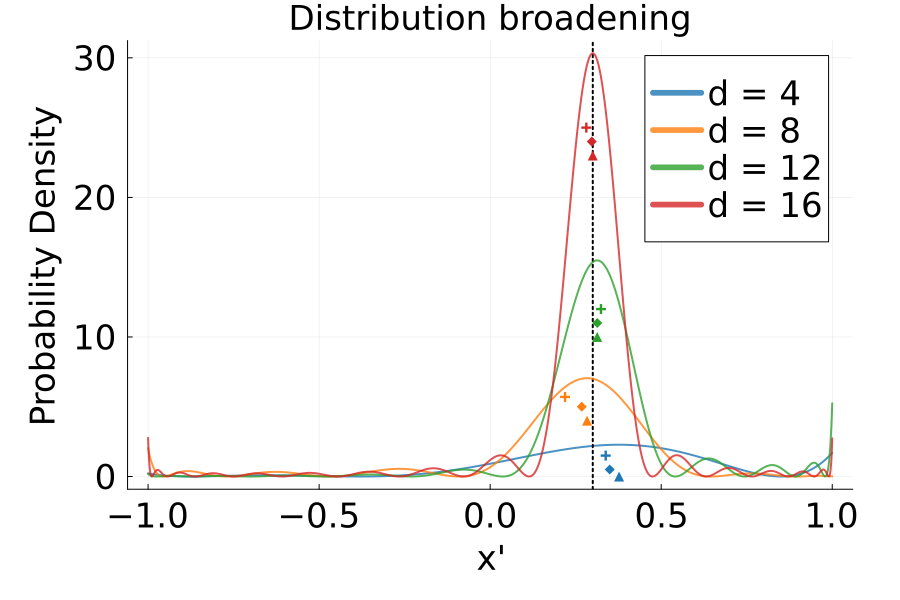

In [392]:
cpal = palette(:tab10)
fstyle = font("sans-serif", 23)
plot(xvals, probas[1, :], label="d = 4", c=cpal[1], lw=2, xlabel="x'", alpha=0.8,
    ylabel="Probability Density", xtickfont=fstyle, guidefont=fstyle, legendfont=fstyle,
    ytickfont=fstyle, size=(900, 600), left_margin=10mm, bottom_margin=10mm, right_margin=10mm, 
    title="Distribution broadening", titlefont=fstyle)
vline!([gt], lw=2, c=:black, ls=:dot, label="")
scatter!([stats_per_d[4][:mean]], [1.5], label="", msw=2, ms=5, c=cpal[1], shape=:cross)
scatter!([stats_per_d[4][:median]], [0.5], label="", msw=0, ms=5, c=cpal[1], shape=:diamond)
scatter!([stats_per_d[4][:mode]], [0.0], label="", msw=0, ms=5, c=cpal[1], shape=:utriangle)

plot!(xvals, probas[2, :], c=cpal[2], label="d = 8", alpha=0.8,lw=2)
scatter!([stats_per_d[8][:mean]], [5.7], label="", msw=2, ms=5, c=cpal[2], shape=:cross)
scatter!([stats_per_d[8][:median]], [5], label="", msw=0, ms=5, c=cpal[2], shape=:diamond)
scatter!([stats_per_d[8][:mode]], [4], label="", msw=0, ms=5, c=cpal[2], shape=:utriangle)

plot!(xvals, probas[3, :], c=cpal[3], label="d = 12", alpha=0.8,lw=2)
scatter!([stats_per_d[12][:mean]], [12], label="", msw=2, ms=5, c=cpal[3], shape=:cross)
scatter!([stats_per_d[12][:median]], [11], label="", msw=0, ms=5, c=cpal[3], shape=:diamond)
scatter!([stats_per_d[12][:mode]], [10], label="", msw=0, ms=5, c=cpal[3], shape=:utriangle)

plot!(xvals, probas[4, :], c=cpal[4], label="d = 16", alpha=0.8,lw=2)
scatter!([stats_per_d[16][:mean]], [25], label="", msw=2, ms=5, c=cpal[4], shape=:cross)
scatter!([stats_per_d[16][:median]], [24], label="", msw=0, ms=5, c=cpal[4], shape=:diamond)
scatter!([stats_per_d[16][:mode]], [23], label="", msw=0, ms=5, c=cpal[4], shape=:utriangle)


#savefig("dist_broadening.svg")